In [130]:
import ee
import ee.mapclient
import geemap.geemap as geemap
import numpy as np
import imageio as iio
import geopy.distance
import sqlite3

# ee.Authenticate()
ee.Initialize(project="ee-surfactant")

cdl = (
    ee.ImageCollection("USDA/NASS/CDL")
    .filter(ee.Filter.date("2018-01-01", "2019-12-31"))
    .first()
)

dw = ee.ImageCollection("GOOGLE/DYNAMICWORLD/V1").filter(ee.Filter.date('2021-04-02', '2021-04-03'))


In [52]:
dwLayer = dw.select("classification")
Map = geemap.Map(center=(40, -100), zoom=4)
cropLandcover = cdl.select("cropland")

In [53]:
print(dw.getInfo())

{'type': 'ImageCollection', 'bands': [], 'version': 1686698052645713, 'id': 'GOOGLE/DYNAMICWORLD/V1', 'features': [{'type': 'Image', 'bands': [{'id': 'water', 'data_type': {'type': 'PixelType', 'precision': 'double'}, 'dimensions': [7868, 5803], 'crs': 'EPSG:32656', 'crs_transform': [10, 0, 830890, 0, 10, 741830]}, {'id': 'trees', 'data_type': {'type': 'PixelType', 'precision': 'double'}, 'dimensions': [7868, 5803], 'crs': 'EPSG:32656', 'crs_transform': [10, 0, 830890, 0, 10, 741830]}, {'id': 'grass', 'data_type': {'type': 'PixelType', 'precision': 'double'}, 'dimensions': [7868, 5803], 'crs': 'EPSG:32656', 'crs_transform': [10, 0, 830890, 0, 10, 741830]}, {'id': 'flooded_vegetation', 'data_type': {'type': 'PixelType', 'precision': 'double'}, 'dimensions': [7868, 5803], 'crs': 'EPSG:32656', 'crs_transform': [10, 0, 830890, 0, 10, 741830]}, {'id': 'crops', 'data_type': {'type': 'PixelType', 'precision': 'double'}, 'dimensions': [7868, 5803], 'crs': 'EPSG:32656', 'crs_transform': [10, 0,

In [54]:
Map.addLayer(cropLandcover, {}, "Crop Landcover")
Map.addLayer(dw, {}, "Dynamic World")

In [55]:
michigan_geometry = ee.FeatureCollection('FAO/GAUL/2015/level1').filter(ee.Filter.eq('ADM1_NAME', 'Michigan')).first().geometry()

In [121]:
michigan_geometry_reprojected = michigan_geometry.transform('EPSG:4326')
michigan_grid = michigan_geometry.coveringGrid('EPSG:4326', 400)



In [122]:
Map = geemap.Map(center=(44, -85), zoom=9)
Map.addLayer(michigan_grid, {'color': 'red'}, 'Michigan')
Map

Map(center=[44, -85], controls=(WidgetControl(options=['position', 'transparent_bg'], widget=HBox(children=(To…

In [126]:
first_square_info = michigan_grid.first().getInfo()
first_square_info

{'type': 'Feature',
 'geometry': {'geodesic': False,
  'crs': {'type': 'name', 'properties': {'name': 'EPSG:4326'}},
  'type': 'Polygon',
  'coordinates': [[[-84.80814934315579, 41.692608966555234],
    [-84.80455608201932, 41.692608966555234],
    [-84.80455608201932, 41.696202227691714],
    [-84.80814934315579, 41.696202227691714],
    [-84.80814934315579, 41.692608966555234]]]},
 'id': '-23602,11603',
 'properties': {}}

In [128]:
first_point = first_square_info['geometry']['coordinates'][0][0]
second_point = first_square_info['geometry']['coordinates'][0][1]
third_point = first_square_info['geometry']['coordinates'][0][2]
fourth_point = first_square_info['geometry']['coordinates'][0][3]

first_point.reverse()
second_point.reverse()
third_point.reverse()
fourth_point.reverse()

print(first_point)
print(second_point)
print(third_point)
print(fourth_point)

print('1 -> 2', geopy.distance.distance(first_point, second_point))
print('2 -> 3', geopy.distance.distance(second_point, third_point))
print('3 -> 4', geopy.distance.distance(third_point, fourth_point))
print('4 -> 1', geopy.distance.distance(fourth_point, first_point))
print('1 -> 3', geopy.distance.distance(first_point, third_point))
print('2 -> 4', geopy.distance.distance(second_point, fourth_point))

[41.692608966555234, -84.80814934315579]
[41.692608966555234, -84.80455608201932]
[41.696202227691714, -84.80455608201932]
[41.696202227691714, -84.80814934315579]
1 -> 2 0.29913288250017545 km
2 -> 3 0.3990940039002275 km
3 -> 4 0.2991162343567063 km
4 -> 1 0.3990940039002275 km
1 -> 3 0.4987499627997646 km
2 -> 4 0.4987499627997646 km


In [131]:
conn = sqlite3.connect('michigan.db')
cur = conn.cursor()

In [140]:
print(michigan_grid.size().getInfo())

EEException: User memory limit exceeded.

In [137]:
grid_elements = michigan_grid.toList(1, 10).getInfo()
grid_elements

EEException: User memory limit exceeded.

In [22]:
first_polygon = michigan_grid.first().geometry()
image_collection = ee.ImageCollection("COPERNICUS/S2_SR_HARMONIZED").filterBounds(first_polygon).filterDate('2020').select('B4', 'B3', 'B2')
print(image_collection.getInfo())
# image = image_collection.mosaic().clip(first_polygon)
# print(image.getInfo())


{'type': 'ImageCollection', 'bands': [], 'id': 'COPERNICUS/S2_SR_HARMONIZED', 'version': 1686493419203377, 'properties': {'date_range': [1490659200000, 1647907200000], 'period': 0, 'system:visualization_0_min': '0.0', 'type_name': 'ImageCollection', 'keywords': ['copernicus', 'esa', 'eu', 'msi', 'reflectance', 'sentinel', 'sr'], 'system:visualization_0_bands': 'B4,B3,B2', 'thumb': 'https://mw1.google.com/ges/dd/images/COPERNICUS_S2_SR_thumb.png', 'description': '<p>Sentinel-2 is a wide-swath, high-resolution, multi-spectral\nimaging mission supporting Copernicus Land Monitoring studies,\nincluding the monitoring of vegetation, soil and water cover,\nas well as observation of inland waterways and coastal areas.</p><p>The Sentinel-2 L2 data are downloaded from scihub. They were\ncomputed by running sen2cor. WARNING: ESA did not produce L2 data\nfor all L1 assets, and earlier L2 coverage is not global.</p><p>The assets contain\n12 UINT16 spectral bands representing SR scaled by 10000 (unl

In [28]:
image = iio.imread('~/Downloads/imageToDriveExample_transform.tif')

In [31]:
image = np.array(image)
print(image.shape)
print(image.mean().mean())
print('max: ', image.max().max())
print('min: ', image.min().min())

(1001, 1001, 4)
1110.2681172473879
max:  8640
min:  0


In [30]:
import matplotlib.pyplot as plt

In [47]:
scaled_image = image / image.max().max()
print(scaled_image.mean().mean())
print(scaled_image.dtype)
print(scaled_image.shape)

0.12850325431104026
float64
(1001, 1001, 4)


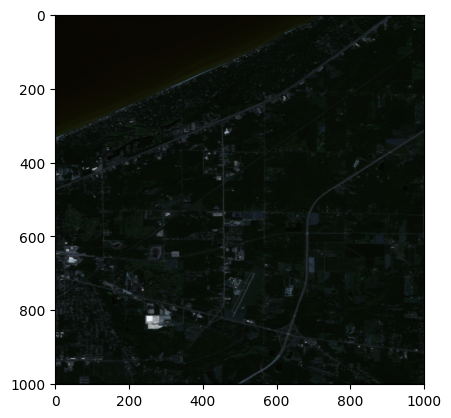

In [48]:
plt.imshow(scaled_image[:, :, 0:3])